# Analysis of hippocampal theta sweeps across hemispheres

***Sidney Rafilson | Buzsaki Lab***



This notebook loads the preprocessed electrophysiology (CatGT -> Kilosort4 -> CellMetrics) and tracking data, builds spike rate matrices and place fields and implements bayessian decoding

In [17]:
import numpy as np
import pandas as pd

from tqdm import tqdm

from scipy.stats import zscore, wasserstein_distance
from scipy.interpolate import interp1d
from scipy.io import loadmat
from scipy.special import logsumexp

import matplotlib.pyplot as plt
import seaborn as sns
import plotly.graph_objects as go

from core import *

sns.set_context('notebook', font_scale=1.5)

## Pipeline configuration settings

In [4]:
# ----------------------------- Config ---------------------------------

# Data paths and session info
DATA_DIR = r"\\research-cifs.nyumc.org\research\buzsakilab\Homes\voerom01\Bilat_HPC\Bilat_R02\Bilat_R02_20251106"
SESSION_NAME = "pre_sleep_g0"
BASE_NAME = "Bilat_R02_20251106"
PROBES = [0, 1, 2, 3]


# Spike rate computation parameters
WINDOW_SIZE = 0.04          # s
STEP_SIZE   = 0.04        # s
SIGMA       = 12.5          # smoothing sigma (0 -> no smoothing)
USE_UNITS   = "good"       # {'all', 'good', 'mua'}
NORMALIZE   = True         # z-score each unit's rates

# Filtering thresholds
MIN_TOTAL_SPIKES   = 100
MIN_MEAN_RATE_HZ   = 0.01
MIN_PRESENCE_RATIO = 0.25
N_TIME_BINS        = 100    # coarse bins for presence ratio


# defining the region dictionary. Keys are probe numbers, values are dictionaries which are further mapping shanks to regions
#region_dict = {0: {0: 'CA1', 1: 'RSP', 2: 'CA3', 3: 'CA1', 4: 'RSP', 5: 'CA3', 6: 'CA1', 7: 'RSP'}, 1: {0: 'CA3', 1: 'CA1', 2: 'CA2', 3: 'A1', 4: 'S1'}, 2: {0: 'CA3', 1: 'Th', 2: 'V1', 3: 'Th', 4: 'CA1', 5: 'V1', 6: 'CA1', 7: 'V1'}} UDS
region_dict = {
    0: {0: 'CA1', 1: 'Th', 2: 'CA1', 3: 'CA1', 4: 'CA1', 5: 'CA1', 6: 'CA1', 7: 'CA1'},
    1: {0: 'CA1', 1: 'CA1', 2: 'CA1', 3: 'CA1', 4: 'CA1', 5: 'CA1', 6: 'CA1', 7: 'CA1'},
    2: {0: 'CA1', 1: 'CA1', 2: 'CA1', 3: 'CA1', 4: 'CA1', 5: 'CA1', 6: 'CA1', 7: 'CA1', 8: 'CA1', 9: 'CA1', 10: 'CA1', 11: 'CA1', 12: 'Th'},
    3: {0: 'CA1', 1: 'CA1', 2: 'CA1', 3: 'CA1', 4: 'CA1', 5: 'CA1', 6: 'CA1', 7: 'CA1', 8: 'CA1', 9: 'CA1', 10: 'CA1', 11: 'CA1', 12: 'CA1', 13: 'CA1', 14: 'CA1', 15: 'CA1'}
}


# defining the hemisphere dictionary. Keys are probe numbers, values are 'L' or 'R' for left/right hemisphere
hemisphere_dict = {0: 'L', 1: 'L', 2: 'R', 3: 'R'}

In [3]:
# ------------------------ Optionally save & load region dictionary ------------------------
save_region_dict = True
if save_region_dict:
    dict_file = open(os.path.join(DATA_DIR, 'region_dict.pkl'), 'wb')
    dict_file.write(str(region_dict).encode())
    dict_file.close()

load_region_dict = True
if load_region_dict:
    dict_file = open(os.path.join(DATA_DIR, 'region_dict.pkl'), 'rb')
    region_dict = eval(dict_file.read().decode())
    dict_file.close()


## Loading the spike rate matrices

In [5]:
# ------------------------ Load spike rate matrices ------------------------
spike_rate_matrices = {}
cell_types = {}
regions = {}
for probe in PROBES:
    # Get the raw spike counts and the zscored and smoothed spike rates
    ks_dir = os.path.join(DATA_DIR, f'Kilosort_imec{probe}_ks4')
    raw_rates, time_bins, units = compute_spike_rates(str(ks_dir), WINDOW_SIZE, STEP_SIZE, USE_UNITS, 0.0, False)
    spike_rate_matrix, _, _ = compute_spike_rates(str(ks_dir), WINDOW_SIZE, STEP_SIZE, USE_UNITS, SIGMA, NORMALIZE)
    est_counts_per_bin = raw_rates * WINDOW_SIZE


    # computing the filtering metrics
    total_spikes   = est_counts_per_bin.sum(axis=1)         
    mean_rate_hz   = raw_rates.mean(axis=1)
    presence_ratio = get_presence_ratio(est_counts_per_bin, time_bins, N_TIME_BINS)

    mask = (
        (total_spikes >= MIN_TOTAL_SPIKES) &
        (mean_rate_hz >= MIN_MEAN_RATE_HZ) &
        (presence_ratio >= MIN_PRESENCE_RATIO)
    )


    # Apply mask to spike rate matrix and unit list
    spike_rate_matrix = spike_rate_matrix[mask, :]
    units = [u for u, keep in zip(units, mask) if keep]
    print(f"Probe {probe}: Keeping {mask.sum()} / {mask.sum() + (~mask).sum()} units after filtering.\nspike_rate_matrix shape: {spike_rate_matrix.shape}\n")

    # remove units based on presence ratio
    spike_rate_matrices[probe] = (spike_rate_matrix, time_bins, units)


    # Load the cell metrics
    cell_metrics_file = os.path.join(DATA_DIR, f'{BASE_NAME}_imec{probe}.cell_metrics.cellinfo.mat')
    cell_type = loadmat(cell_metrics_file)['cell_metrics']['putativeCellType'][0,0].flatten()
    shank_ids = loadmat(cell_metrics_file)['cell_metrics']['shankID'][0,0].flatten()


    # keeping only the string labels
    cell_type = np.array([ct[0] if isinstance(ct, np.ndarray) else ct for ct in cell_type])

    # removing mask applied units from cell type
    cell_types[probe] = cell_type[mask]
    regions[probe] = np.array([region_dict[probe][shank_id-1] for shank_id in shank_ids[mask]])  # shank IDs are 1-based

Probe 0: Keeping 55 / 60 units after filtering.
spike_rate_matrix shape: (55, 263023)

Probe 1: Keeping 41 / 41 units after filtering.
spike_rate_matrix shape: (41, 263023)

Probe 2: Keeping 248 / 275 units after filtering.
spike_rate_matrix shape: (248, 263027)

Probe 3: Keeping 200 / 208 units after filtering.
spike_rate_matrix shape: (200, 263027)



## Plotting spike rates by region

In [7]:
# --- Configuration ---
regions_of_interest = ['CA1']

cell_type_groups = {
    'Pyramidal':   ['Pyramidal Cell'],
    'Interneuron': ['Narrow Interneuron', 'Wide Interneuron'],
}

facet_by = "celltype"  # ignored below; we force "one heatmap per cell type"

# get the time bins from the first probe
first_probe = PROBES[0]
_, time_bins, _ = spike_rate_matrices[first_probe]


# -----------------------------
# 1) Collect matrices by (celltype, region) for global vmin/vmax
# -----------------------------
per_celltype_region = {}  # dict[celltype][region][hemisphere] = matrix (unsorted)
all_vals_for_scale = []

for celltype_key in cell_type_groups.keys():
    per_celltype_region[celltype_key] = {}
    for region_name in regions_of_interest:
        per_celltype_region[celltype_key][region_name] = {}
        for hemi in ['L', 'R']:
            M = collect_matrix_for_bilat(
                spike_rate_matrices, region_name, regions,
                celltype_key, cell_types, PROBES, cell_type_groups, hemi, hemisphere_dict
            )
            per_celltype_region[celltype_key][region_name][hemi] = M
            if M is not None and M.size > 0:
                all_vals_for_scale.append(M.ravel())

if len(all_vals_for_scale) == 0:
    raise RuntimeError("No units found for the chosen regions/cell types after filtering.")

all_vals = np.concatenate(all_vals_for_scale)
vmin = np.percentile(all_vals, 2.5)
vmax = np.percentile(all_vals, 97.5)

# print the structure of the per_celltype_region dictionary
for celltype_key in per_celltype_region:
    print(f"Cell type: {celltype_key}")
    for region_name in per_celltype_region[celltype_key]:
        for hemi in per_celltype_region[celltype_key][region_name]:
            M = per_celltype_region[celltype_key][region_name][hemi]
            shape_str = "None" if M is None else str(M.shape)
            print(f"  Region: {region_name}, Hemisphere: {hemi}, Matrix shape: {shape_str}")


# -----------------------------
# 2) Build per-celltype concatenated heatmaps (sorted region-by-region)
# -----------------------------
def build_concatenated_sorted(M_by_region, sort_mode='corr'):
    """
    Input: dict[region] -> M
    Returns:
      M_concat: vertically concatenated heatmap (regions stacked)
      sections: list of (region_name, start_row, end_row) in M_concat
    """
    blocks = []
    sections = []
    row_cursor = 0
    for region_name in regions_of_interest:
        M = M_by_region.get(region_name, None)
        if M is None or M.size == 0:
            continue
        M_sorted = sort_units(M, mode=sort_mode)
        nrows = M_sorted.shape[0]
        blocks.append(M_sorted)
        sections.append((region_name, row_cursor, row_cursor + nrows))
        row_cursor += nrows

    if len(blocks) == 0:
        return None, []

    M_concat = np.vstack(blocks)
    return M_concat, sections


# Build concatenated matrices for each cell type and each hemisphere
# Build concatenated matrices for each cell type and each hemisphere
concat_by_celltype = {}
sections_by_celltype = {}

for celltype_key in cell_type_groups.keys():
    for hemi in ['L', 'R']:
        print(f"Building concatenated matrix for cell type: {celltype_key}, Hemisphere: {hemi}")

        # build dict[region_name] -> M for THIS hemisphere
        M_by_region_hemi = {}
        for region_name in regions_of_interest:
            # be slightly defensive in case a region is missing:
            region_dict = per_celltype_region[celltype_key].get(region_name, {})
            M_by_region_hemi[region_name] = region_dict.get(hemi, None)

        # now this matches the expected input: dict[region] -> matrix
        M_concat, sections = build_concatenated_sorted(
            M_by_region_hemi,
            sort_mode='corr'
        )

        concat_by_celltype[(celltype_key, hemi)] = M_concat
        sections_by_celltype[(celltype_key, hemi)] = sections




Cell type: Pyramidal
  Region: CA1, Hemisphere: L, Matrix shape: (61, 263023)
  Region: CA1, Hemisphere: R, Matrix shape: (275, 263027)
Cell type: Interneuron
  Region: CA1, Hemisphere: L, Matrix shape: (20, 263023)
  Region: CA1, Hemisphere: R, Matrix shape: (173, 263027)
Building concatenated matrix for cell type: Pyramidal, Hemisphere: L
Building concatenated matrix for cell type: Pyramidal, Hemisphere: R
Building concatenated matrix for cell type: Interneuron, Hemisphere: L
Building concatenated matrix for cell type: Interneuron, Hemisphere: R


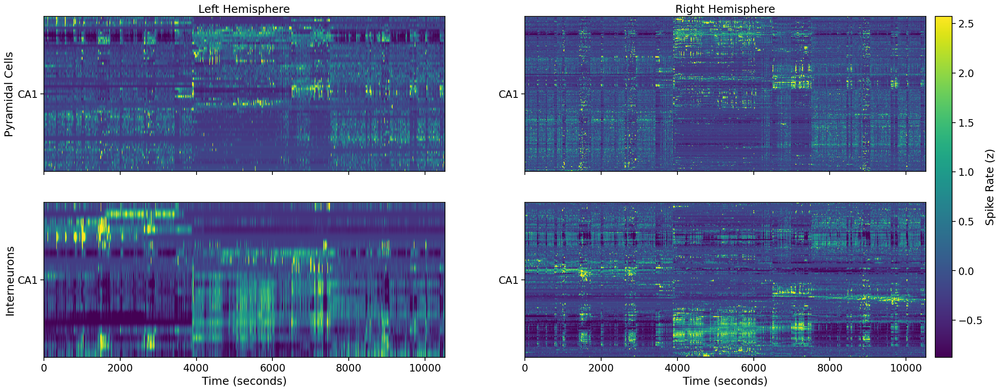

In [8]:
# -----------------------------
# 3) Plot: one heatmap per celltype and hemisphere
# -----------------------------
celltype_order = list(cell_type_groups.keys())  # e.g., ["Pyramidal", "Interneuron"]
n_rows = len(celltype_order)

fig, axs = plt.subplots(
    n_rows, 2,
    figsize=(27, 5 * n_rows),
    sharex=True,
    squeeze=False
)

first_im = None
visible_axes = []

for j, hemi in enumerate(['L', 'R']):
    for i, celltype_key in enumerate(celltype_order):
        ax = axs[i, j]
        M_concat = concat_by_celltype.get((celltype_key, hemi), None)

        if M_concat is None or M_concat.size == 0:
            ax.set_visible(False)
            continue

        im = ax.imshow(
            M_concat,
            aspect='auto',
            cmap='viridis',
            extent=[time_bins[0], time_bins[-1], 0, M_concat.shape[0]],
            vmin=vmin,
            vmax=vmax,
            origin='lower'
        )
        if first_im is None:
            first_im = im
        visible_axes.append(ax)

        # --- Draw region separators and centered labels ---
        sections = sections_by_celltype[(celltype_key, hemi)]
        ytick_positions = []
        ytick_labels = []

        for (region_name, start_row, end_row) in sections:
            # Separator line at the top of each region except the first
            if start_row > 0:
                ax.axhline(y=start_row, color='white', linewidth=1.5, alpha=0.9)
            # Center position for label
            center = 0.5 * (start_row + end_row)

            ytick_positions.append(center)
            ytick_labels.append(region_name)

        # Add a bottom boundary line for the last region
        if sections:
            ax.axhline(y=sections[-1][2], color='white', linewidth=1.5, alpha=0.9)

        ax.set_yticks(ytick_positions)
        ax.set_yticklabels(ytick_labels)
        #ax.set_ylabel(f"{celltype_key}\n")

        # Title per heatmap
        ax.set_title(f"{celltype_key}")

# Shared x label
axs[-1, 0].set_xlabel("Time (seconds)")
axs[-1, 1].set_xlabel("Time (seconds)")

# Single shared colorbar
if first_im is not None:
    cbar = fig.colorbar(first_im, ax=visible_axes, orientation='vertical', fraction=0.04, pad=0.01)
    cbar.set_label("Spike Rate (z)")


axs[0,0].set_ylabel('Pyramidal Cells')
axs[1,0].set_ylabel('Interneurons')

axs[0,0].set_title('Left Hemisphere')
axs[0,1].set_title('Right Hemisphere')
axs[1,0].set_title('')
axs[1,1].set_title('')


#plt.savefig("firing_rates.png", dpi=300)

plt.show()



## Extracting the position tracking data 

Number of TTLs: 240196
Number of frames: 308232
Trimming frames from 308232 to 240196
Tracking start time: 3913.393 s, end time: 6495.247 s, duration: 2581.854 s


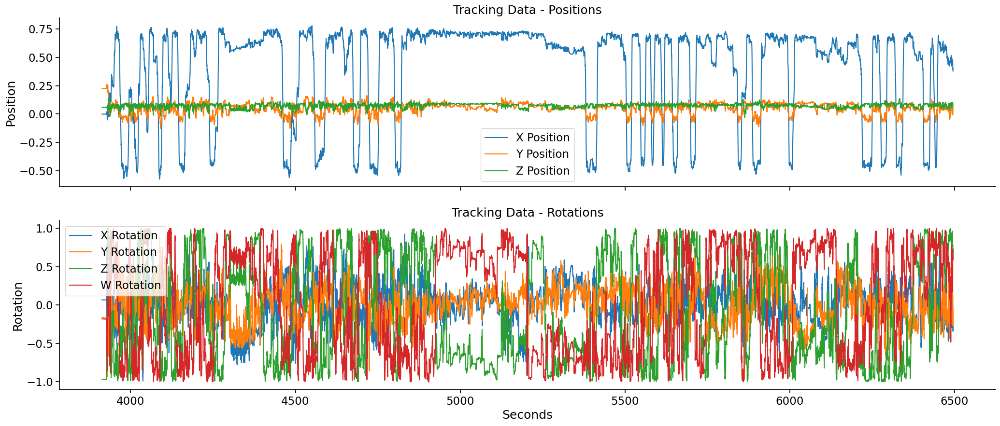

In [9]:
# Loadding in the TTLs
ttl_file = os.path.join(DATA_DIR, 'preprocessing_output', f'supercat_{SESSION_NAME}', f'{SESSION_NAME}_tcat.obx0.obx.xd_6_12_0.txt')
ttls = np.loadtxt(ttl_file)
print(f"Number of TTLs: {len(ttls)}")

# Loadding in the tracking data
tracking_file = os.path.join(DATA_DIR, "Bilat_R02_20251106_linear_maze_000.csv")
tracking_data = np.genfromtxt(tracking_file, delimiter=",", skip_header=7)
frames = tracking_data[:,0]
print(f'Number of frames: {len(frames)}')


# Sometimes there are a few more frames after the last TTL or more TTLs than frames. We will trim the data to the shortest length.
if len(frames) < len(ttls):
    print(f'Trimming TTLs from {len(ttls)} to {len(frames)}')
    ttls = ttls[:len(frames)]
    tracking_data = tracking_data[:len(frames),:]
elif len(frames) > len(ttls):
    print(f'Trimming frames from {len(frames)} to {len(ttls)}')
    frames = frames[:len(ttls)]
    tracking_data = tracking_data[:len(ttls),:]

# printing the start and end times
print(f'Tracking start time: {ttls[0]:.3f} s, end time: {ttls[-1]:.3f} s, duration: {ttls[-1]-ttls[0]:.3f} s')


# fill missing values or nan with linear interpolation
for i in range(tracking_data.shape[1]):
    col = tracking_data[:,i]
    nans = np.isnan(col)
    if np.any(nans):
        not_nans = ~nans
        interp_func_col = interp1d(frames[not_nans], col[not_nans], bounds_error=False, fill_value="extrapolate")
        col[nans] = interp_func_col(frames[nans])
        tracking_data[:,i] = col

# extract x, y, z positions and rotations
x_rotations = tracking_data[:,2]
y_rotations = tracking_data[:,3]
z_rotations = tracking_data[:,4]
w_rotations = tracking_data[:,5]
x_positions = tracking_data[:,6]
y_positions = tracking_data[:,7]
z_positions = tracking_data[:,8]

# Plotting the tracking data
fig, axs = plt.subplots(2, 1, figsize=(25,10), sharex=True)

sns.lineplot(ax=axs[0], x=ttls, y=x_positions, label='X Position')
sns.lineplot(ax=axs[0], x=ttls, y=y_positions, label='Y Position')
sns.lineplot(ax=axs[0], x=ttls, y=z_positions, label='Z Position')
axs[0].set_ylabel('Position')
axs[0].set_title('Tracking Data - Positions')

sns.lineplot(ax=axs[1], x=ttls, y=x_rotations, label='X Rotation')
sns.lineplot(ax=axs[1], x=ttls, y=y_rotations, label='Y Rotation')
sns.lineplot(ax=axs[1], x=ttls, y=z_rotations, label='Z Rotation')
sns.lineplot(ax=axs[1], x=ttls, y=w_rotations, label='W Rotation')
axs[1].set_xlabel('Seconds')
axs[1].set_ylabel('Rotation')
axs[1].set_title('Tracking Data - Rotations')
sns.despine()
plt.show()


In [10]:
# choose which position to use
pos_raw = x_positions  # original position samples aligned to `frames` (units: cm)
assert frames.shape[0] == pos_raw.shape[0]

# compute the velocity
velocity = np.gradient(pos_raw) / np.gradient(ttls)  # velocity in m/s

# getting the running direction
running_direction = np.sign(velocity)

# getting the speed
speed = np.abs(velocity)  # speed in m/s

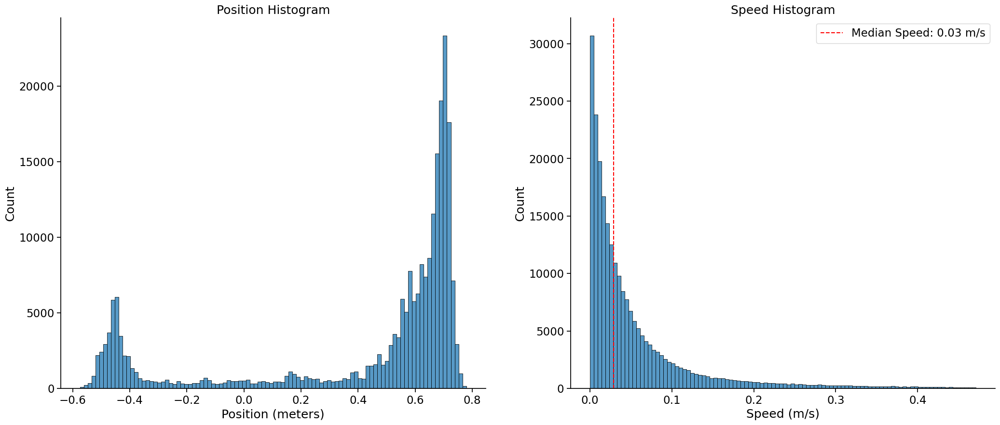

In [11]:
# Plotting some position statistics
fig, axs = plt.subplots(1, 2, figsize=(25,10))
sns.histplot(ax=axs[0], x=pos_raw, bins=100)
axs[0].set_xlabel('Position (meters)')
axs[0].set_ylabel('Count')
axs[0].set_title('Position Histogram')

sns.histplot(ax=axs[1], x=speed[speed < np.percentile(speed, 99)], bins=100)
axs[1].set_xlabel('Speed (m/s)')
axs[1].set_ylabel('Count')
axs[1].set_title('Speed Histogram')
axs[1].axvline(x = np.median(speed), color='red', linestyle='--', label=f'Median Speed: {np.median(speed):.2f} m/s')
axs[1].legend()
sns.despine()
plt.show()


## Plotting the place fields organized by region

Using Kullback-Leibler divergence to find best place fields

In [35]:
# -----------------------
# Config
# -----------------------
n_spatial_bins = 100
pos_min, pos_max = -0.5, 0.7
speed_threshold = 0.03  # m/s
threshold = 10  # percentile threshold for Wasserstein distance
regions_of_interest = ['CA1']
cell_type_groups = {
    'Pyramidal':   ['Pyramidal Cell'],
    'Interneuron': ['Narrow Interneuron', 'Wide Interneuron'],
}
sort_by = 'peak'



# computing the spatial bin edges
bin_edges = np.linspace(pos_min, pos_max, n_spatial_bins + 1)

pos_interp_func = interp1d(ttls, pos_raw, bounds_error=False, fill_value=np.nan)

# -----------------------
# Precompute per-probe masks and occupancy
# -----------------------
probe_data = {}  # probe -> dict with masks, idx, denom, tb_m, pos_m, spike_rates_m
for probe in PROBES:
    for d in [-1, 0, 1]:
        spike_rate_matrix, tb, units = spike_rate_matrices[probe]  # (n_units, n_timebins)
        ct_probe = np.asarray(cell_types[probe])                    # len == n_units

        # Interpolate position to this probe’s time grid
        pos_probe = pos_interp_func(tb)

        # TTL crop
        start_time, end_time = np.min(ttls), np.max(ttls)
        valid_time = (tb >= start_time) & (tb <= end_time)

        fr = spike_rate_matrix[:, valid_time]
        tb_crop = tb[valid_time]
        pos_crop = pos_probe[valid_time]

        # Direction mask (per timepoint)
        vel = np.gradient(pos_crop, tb_crop)
        direction = np.sign(vel)
        if d == 0:
            direction_mask = np.ones_like(direction, dtype=bool)
        else:
            direction_mask = direction == d

        pos_crop = pos_crop[direction_mask]
        fr = fr[:, direction_mask]
        tb_crop = tb_crop[direction_mask]

        # Drop NaN position samples
        ok = ~np.isnan(pos_crop)
        if ok.sum() == 0:
            print(f"Probe {probe}: no valid samples after TTL/position masking.")
            probe_data[probe, d] = None
            continue

        fr = fr[:, ok]
        pos_crop = pos_crop[ok]
        tb_crop = tb_crop[ok]

        # Speed (smoothed) and moving-mask
        # gradient(pos, time) already gives velocity (m/s)
        speed = np.abs(np.gradient(pos_crop, tb_crop))
        speed = gaussian_filter1d(speed, sigma=3)

        move = speed > speed_threshold
        if move.sum() == 0:
            print(f"Probe {probe}: no samples exceed speed threshold ({speed_threshold} m/s).")
            probe_data[probe, d] = None
            continue

        # Apply moving mask
        fr_m   = fr[:, move]
        pos_m  = pos_crop[move]
        tb_m   = tb_crop[move]

        # Bin positions for this probe
        idx = np.digitize(pos_m, bin_edges, right=True)
        idx = np.clip(idx, 0, n_spatial_bins - 1)

        # Occupancy (counts per spatial bin) for this probe
        denom = np.bincount(idx, minlength=n_spatial_bins).astype(float)
        if denom.sum() == 0:
            print(f"Probe {probe}: zero occupancy across all bins.")
            probe_data[probe, d] = None
            continue

        probe_data[probe, d] = dict(
            fr_m=fr_m, tb_m=tb_m, pos_m=pos_m, idx=idx, denom=denom, ct=ct_probe
        )

# -----------------------
# Build per-(region, celltype) lists of place fields across probes
# -----------------------
panel_pfs = {}  # (row_key, col_key) -> list of 1D PF arrays
panel_wds = {}  # (row_key, col_key) -> list of Wasserstein distances
row_keys = ['Pyramidal', 'Interneuron']
col_keys = list(regions_of_interest)

# Helper to compute one unit's PF using its probe's occupancy
def unit_place_field(fr_unit, idx, denom):
    # weighted average rate per bin: sum(fr at timepoints in bin) / occupancy
    num = np.bincount(idx, weights=fr_unit, minlength=n_spatial_bins).astype(float)
    pf = np.divide(num, denom, out=np.zeros_like(num), where=(denom > 0))

    
    return pf

for hemi in ['L', 'R']:
    for d in [-1, 0, 1]:
        for rkey in row_keys:
            for ckey in col_keys:
                panel_pfs[(rkey, ckey, d, hemi)] = []
                panel_wds[(rkey, ckey, d, hemi)] = []
                
# We need unit-level region labels; `regions[probe]` already holds region per unit (after your earlier mask)
for probe in PROBES:
    rgn_arr = regions[probe]  # (n_units_probe,)
    for d in [-1, 0, 1]:
        pdata = probe_data.get((probe, d), None)
        if pdata is None:
            continue

        fr_m   = pdata['fr_m']       # (n_units_probe, n_timepoints_after_masks)
        idx    = pdata['idx']        # (n_timepoints_after_masks,)
        denom  = pdata['denom']      # (n_spatial_bins,)
        ct_arr = pdata['ct']         # (n_units_probe,)
        rgn_arr = regions[probe]     # (n_units_probe,) region name per unit
        hemi = hemisphere_dict[probe]  # (n_units_probe,) hemisphere per unit
        assert hemi in ['L', 'R']

        for rkey in row_keys:
            allowed_ct = set(cell_type_groups[rkey])
            for ckey in col_keys:

                # Select units that are (this region, this cell-type, this direction)
                unit_sel = np.where((np.isin(ct_arr, list(allowed_ct))) & (rgn_arr == ckey))[0]
                if unit_sel.size == 0:
                    continue

                # Compute place field per selected unit and append
                for u in unit_sel:
                    pf = unit_place_field(fr_m[u, :], idx, denom)
                    panel_pfs[(rkey, ckey, d, hemi)].append(pf)

                    # convert place fields to pmf
                    p_min = pf.min()
                    p = pf - p_min  # shift to non-negative
                    p_sum = p.sum()
                    if p_sum > 0:
                        p = p / p_sum
                    else:
                        p = pf * 0.0

                    
                    
                    S = p.sum()
                    if S <= 0:
                        wdist = 0.0
                    else:
                        p = p / S
                        q = np.full_like(p, 1.0 / p.size)
                        # bin centers as support (in meters)
                        bin_centers = 0.5 * (bin_edges[:-1] + bin_edges[1:])
                        wdist = float(wasserstein_distance(bin_centers, bin_centers,
                                                        u_weights=p, v_weights=q))
                    panel_wds[(rkey, ckey, d, hemi)].append(wdist)

   

# -----------------------
# Prepare matrices & global color scale
# -----------------------
panel_mats = {}  # (row_key, col_key) -> 2D array (n_units, n_bins) or None
all_vals = []
for hemi in ['L', 'R']:
    for d in [-1, 0, 1]:
        for rkey in row_keys:
            for ckey in col_keys:

                # extract place fields and wasserstein distances for this panel
                pf_list = panel_pfs[(rkey, ckey, d, hemi)]
                wds_list = panel_wds[(rkey, ckey, d, hemi)]

                # keeping only units with >threshold percentile wasserstein distance
                if len(wds_list) > 0:
                    wd_thresh = np.percentile(wds_list, threshold)
                    pf_list = [pf for pf, wd in zip(pf_list, wds_list) if wd >= wd_thresh]

                if len(pf_list) == 0:
                    panel_mats[(rkey, ckey, d, hemi)] = None
                    continue
                M = np.vstack(pf_list)  # (n_units_in_panel, n_spatial_bins)

                # Sort units by peak bin (descending so earlier peaks at top if you prefer)
                order = np.argsort(np.argmax(M, axis=1))[::-1]
                M = M[order, :]

                panel_mats[(rkey, ckey, d, hemi)] = M
                all_vals.append(M.ravel())

if len(all_vals) == 0:
    raise RuntimeError("No units found for the chosen regions/cell types after masking and binning.")

all_vals = np.concatenate(all_vals)
vmin = np.percentile(all_vals, 2.5)
vmax = np.percentile(all_vals, 97.5)
if vmin == vmax:
    vmax = vmin + 1e-12

    


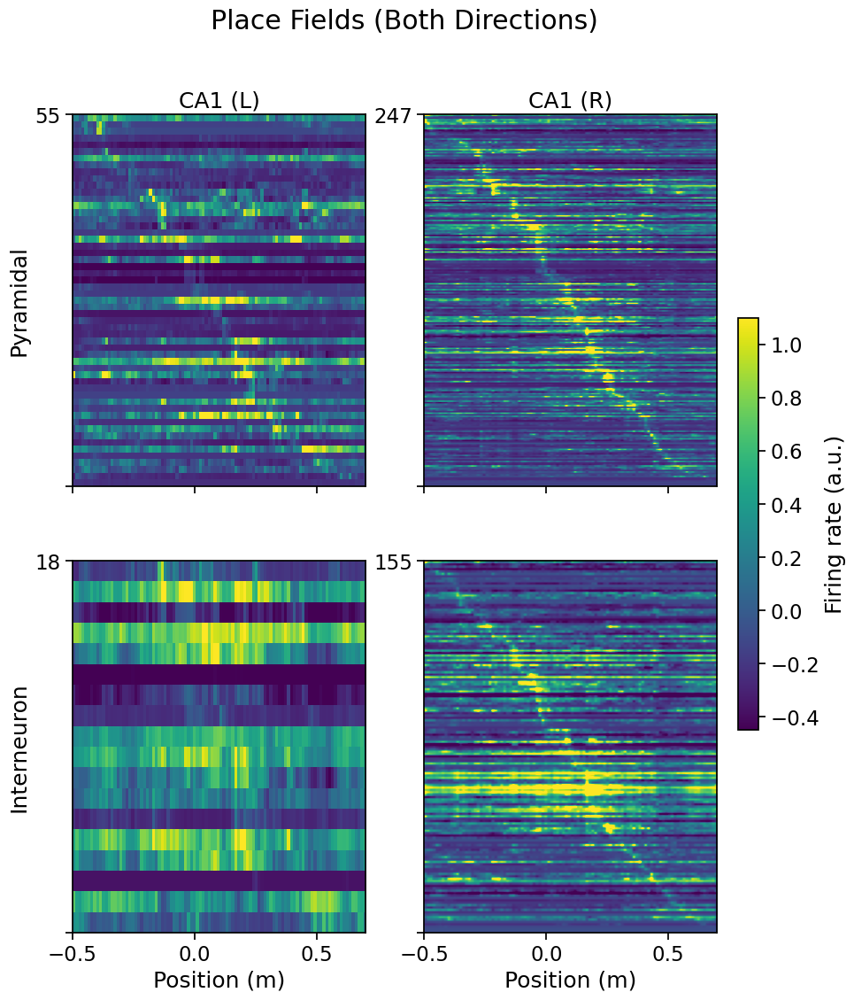

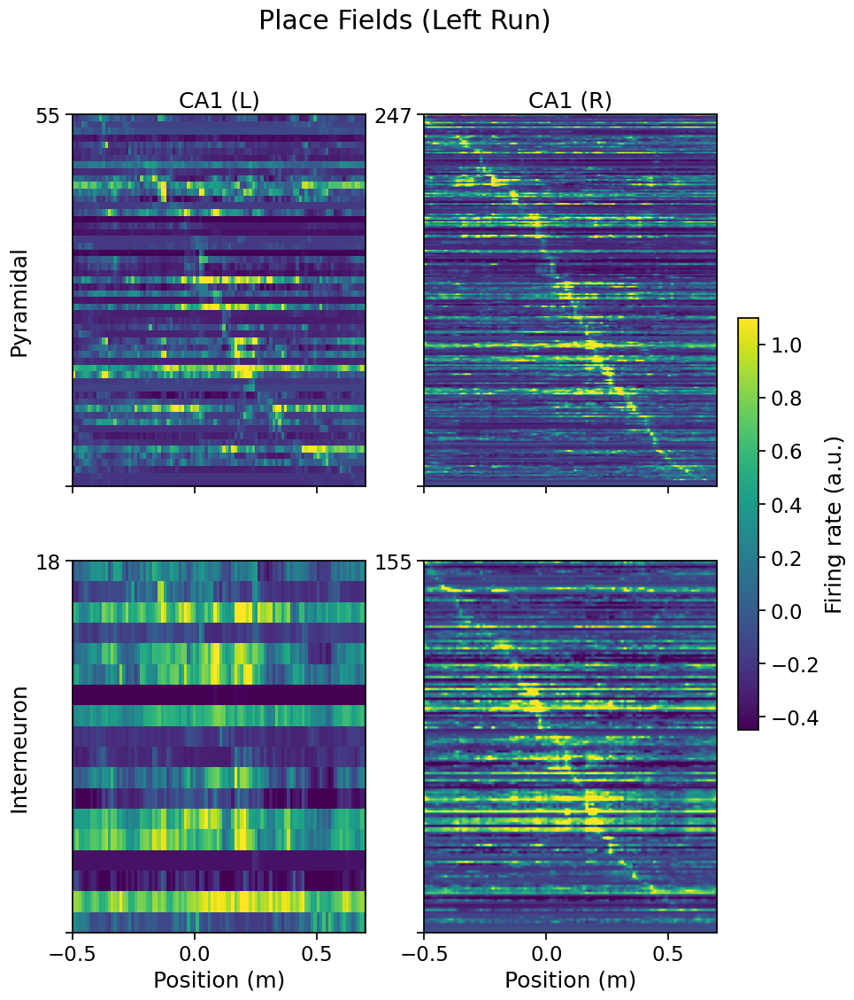

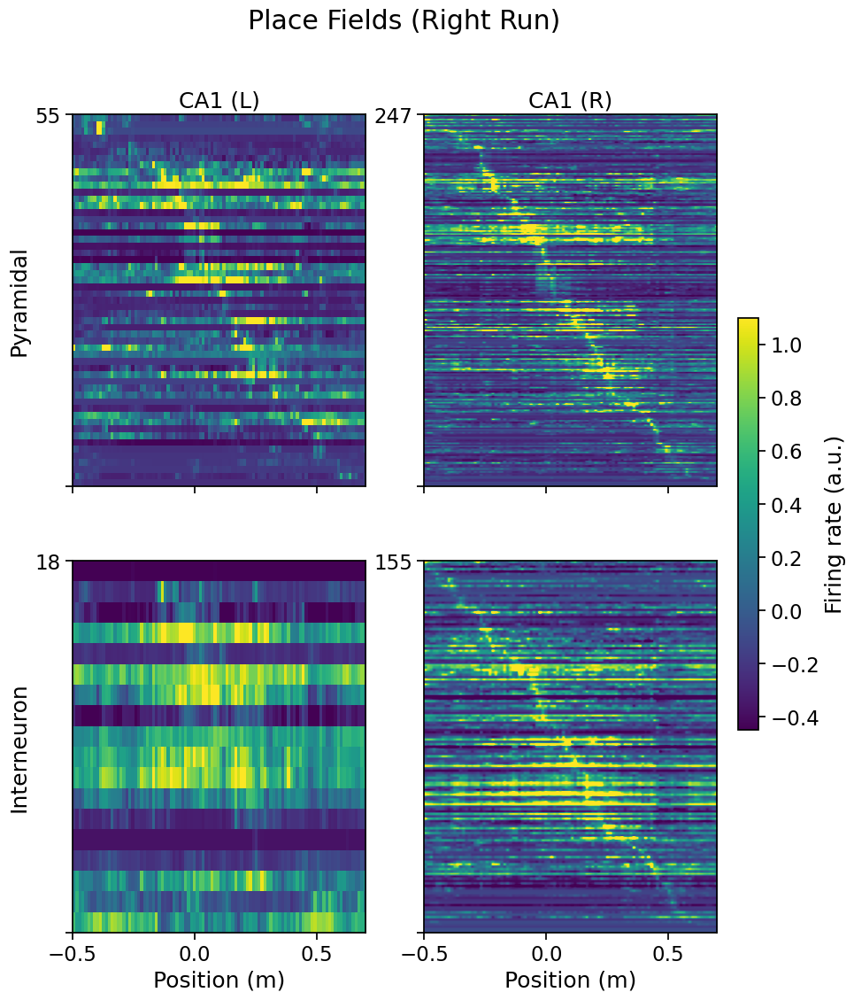

In [36]:

# -----------------------
# Plot
# -----------------------

for direction in [0, -1, 1]:

    n_rows = len(row_keys)                     # e.g. Pyramidal, Interneuron
    n_cols = len(col_keys) * 2                 # two hemispheres per region
    hemispheres = ['L', 'R']

    fig, axs = plt.subplots(
        n_rows, n_cols,
        figsize=(5 * n_cols, 6 * n_rows),
        sharex=True,
        squeeze=False
    )

    first_im = None
    visible_axes = []

    for i, rkey in enumerate(row_keys):        # rows = cell types
        for j_region, ckey in enumerate(col_keys):  # loop over regions
            for h_idx, hemi in enumerate(hemispheres):  # L then R
                j = j_region * 2 + h_idx               # true subplot column index
                ax = axs[i, j]

                M = panel_mats.get((rkey, ckey, direction, hemi))
                if M is None or M.size == 0:
                    ax.set_visible(False)
                    continue

                im = ax.imshow(
                    M,
                    aspect='auto',
                    cmap='viridis',
                    extent=[bin_edges[0], bin_edges[-1], 0, M.shape[0]],
                    vmin=vmin,
                    vmax=vmax,
                    origin='lower'
                )

                if first_im is None:
                    first_im = im
                visible_axes.append(ax)

                # Titles: show region + hemisphere on top row only
                if i == 0:
                    ax.set_title(f"{ckey} ({hemi})")

                # y-axis labels: leftmost column only
                if j == 0:
                    ax.set_ylabel(f"{rkey}")
                else:
                    ax.set_ylabel("")

                # bottom row x-axis label
                if i == n_rows - 1:
                    ax.set_xlabel("Position (m)")

                # simple ytick range label
                ax.set_yticks([0, M.shape[0]])
                ax.set_yticklabels(['', f'{M.shape[0]}'])

    # shared colorbar
    if first_im is not None and visible_axes:
        cbar = fig.colorbar(first_im, ax=visible_axes,
                            orientation='vertical', fraction=0.03, pad=0.03)
        cbar.set_label("Firing rate (a.u.)")

    dir_label = (
        "Both Directions" if direction == 0
        else "Right Run" if direction == 1
        else "Left Run"
    )



    plt.suptitle(f"Place Fields ({dir_label})")
    plt.show()

In [ ]:
# save place fields line plots
output_dir = os.path.join(DATA_DIR, f'place_fields_window_size_{WINDOW_SIZE}_bins_{n_spatial_bins}')
os.makedirs(output_dir, exist_ok=True)

for (rkey, ckey), M in panel_mats.items():
    if M is None or M.size == 0:
        continue
    n_units = M.shape[0]
    for unit_idx in range(n_units):
        pf = M[unit_idx, :]
        plt.figure(figsize=(15,8))
        sns.lineplot(x = 0.5 * (bin_edges[:-1] + bin_edges[1:]), y = pf, linewidth=4)
        plt.title(f'Region: {ckey} — Cell type: {rkey} — Unit {unit_idx}')
        plt.xlabel('Position (m)')
        plt.ylabel('Firing Rate (Hz)')
        sns.despine()
        plot_file_path = os.path.join(output_dir, f'region_{ckey}', f'celltype_{rkey}')
        os.makedirs(plot_file_path, exist_ok=True)
        plot_filename = os.path.join(plot_file_path, f'unit{unit_idx}.png')
        plt.savefig(plot_filename)
        plt.close()

## Bayesian decoding of position from spiking activity

In [ ]:
# ---- Baysian decoding configuration ----
use_regions = ['CA1']
use_unit_types = ['Pyramidal Cell', 'Narrow Interneuron', 'Wide Interneuron']
use_unit_types = ['Pyramidal Cell']
n_spatial_bins = 10
pos_min, pos_max = -0.5, 0.7
speed_threshold = 0.0  # m/s

# compute the spatial bin edges
bin_edges = np.linspace(pos_min, pos_max, n_spatial_bins + 1)

# choose which position to use
pos_raw = x_positions  # original position samples aligned to `frames` (units: cm)
assert frames.shape[0] == pos_raw.shape[0]

# Creating interpolation function for position
pos_interp_func = interp1d(ttls, pos_raw, kind = 'linear', bounds_error=False, fill_value=np.nan)

# getting the spike rates for the selected regions
selected_spike_rates_L = []
selected_spike_rates_R = []


# getting reference time from probe 0
spike_rate_matrix, tb, units = spike_rate_matrices[0]  # (n_units, n_timebins)

# cropping timebins to TTL range
pos = pos_interp_func(tb)
pos_idx = np.digitize(pos, bin_edges, right=True)
valid_time = (tb >= np.min(ttls)) & (tb <= np.max(ttls))
pos_idx = pos_idx[valid_time]
time_bins = tb[valid_time]

# filtering out timebins based on speed
velocity = np.gradient(pos[valid_time]) / np.gradient(tb[valid_time])
speed = np.abs(velocity)
speed = gaussian_filter1d(speed, sigma=1)
move = speed > speed_threshold
time_bins = time_bins[move]
pos_idx = pos_idx[move]
speed = speed[move]

# cropping based on speed threshold

for probe in PROBES:

    spike_rate_matrix, probe_times, units = spike_rate_matrices[probe]  # (n_units, n_timebins)
    hemisphere = hemisphere_dict[probe]

    print(len(probe_times), len(tb), len(valid_time), spike_rate_matrix.shape)
    print(probe_times[-1], tb[-1])

    # cropping probe_times to match reference timebins
    if len(probe_times) != len(tb):
        print(f'Probe {probe} timebins length {len(probe_times)} does not match reference timebins length {len(tb)}')
        # cropping the probe times to match the reference timebins
        start_time, end_time = np.min(tb), np.max(tb)
        valid_time = (probe_times >= start_time) & (probe_times <= end_time)
        # check if all time values are now equal
        probe_times = probe_times[valid_time]
        if np.array_equal(probe_times, tb):
            print(f'Probe {probe} timebins successfully matched to reference timebins after cropping.')
        else:
            raise ValueError(f'Probe {probe} timebins do not match reference timebins after cropping. Lengths: {len(probe_times)} vs {len(tb)}')

    # filtering out timebins outside the TTL range
    spike_rate_matrix = spike_rate_matrix[:, valid_time]

    # filtering out timebins based on speed
    spike_rate_matrix = spike_rate_matrix[:, move]


    ct_probe = np.asarray(cell_types[probe])                    # len == n_units
    rgn_arr = regions[probe]                                   # len == n_units

    # select units from the selected regions
    unit_sel = np.where(
        (np.isin(ct_probe, use_unit_types)) &
        (np.isin(rgn_arr, use_regions))
    )[0]
    if unit_sel.size == 0:
        continue

    if hemisphere == 'L':
        selected_spike_rates_L.extend(spike_rate_matrix[unit_sel, :])
    else:
        selected_spike_rates_R.extend(spike_rate_matrix[unit_sel, :])

# concatenating the selected spike rates across probes
if len(selected_spike_rates_L) == 0 and len(selected_spike_rates_R) == 0:
    raise RuntimeError("No units found for the chosen regions after filtering.")

spike_rates_concat_L = np.vstack(selected_spike_rates_L) if len(selected_spike_rates_L) > 0 else np.empty((0, 0))
spike_rates_concat_R = np.vstack(selected_spike_rates_R) if len(selected_spike_rates_R) > 0 else np.empty((0, 0))

# sort the units based on correlation
spike_rates_concat_L = sort_units(spike_rates_concat_L, mode='corr')
spike_rates_concat_R = sort_units(spike_rates_concat_R, mode='corr')

vmin = np.percentile(np.concatenate([spike_rates_concat_L.ravel(), spike_rates_concat_R.ravel()]), 2.5)
vmax = np.percentile(np.concatenate([spike_rates_concat_L.ravel(), spike_rates_concat_R.ravel()]), 97.5)




263023 263023 263023 (55, 263023)
10520.880000000001 10520.880000000001
263023 263023 263023 (41, 263023)
10520.880000000001 10520.880000000001
263027 263023 263023 (248, 263027)
10521.04 10520.880000000001


IndexError: boolean index did not match indexed array along dimension 1; dimension is 263027 but corresponding boolean dimension is 263023

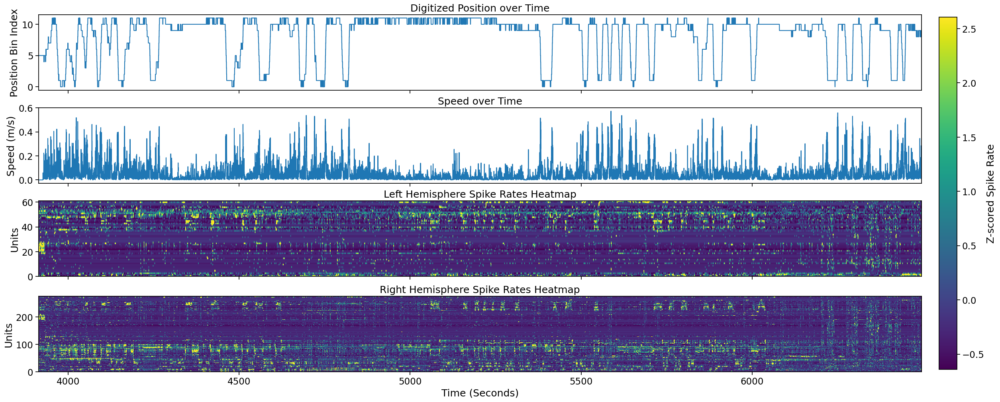

In [50]:
# plotting the digitized positions and the spike rates

dt = np.median(np.diff(time_bins))
n_units_L = spike_rates_concat_L.shape[0]
n_units_R = spike_rates_concat_R.shape[0]
xmin = time_bins[0] - 0.5*dt
xmax = time_bins[-1] + 0.5*dt

fig, axs = plt.subplots(4, 1, figsize=(25, 10), sharex=True, constrained_layout=True)

# Top: line
axs[1].plot(time_bins, speed)
axs[1].set_ylabel('Speed (m/s)')
axs[1].set_title('Speed over Time')
axs[0].plot(time_bins, pos_idx)
axs[0].set_ylabel('Position Bin Index')
axs[0].set_title('Digitized Position over Time')

# Bottom: heatmap with true x via extent
im = axs[2].imshow(
    spike_rates_concat_L, aspect='auto', origin='lower',
    extent=[xmin, xmax, 0, n_units_L],
    vmin=vmin, vmax=vmax, cmap='viridis'
)
axs[2].set_title('Left Hemisphere Spike Rates Heatmap')

# Bottom: heatmap with true x via extent
im = axs[3].imshow(
    spike_rates_concat_R, aspect='auto', origin='lower',
    extent=[xmin, xmax, 0, n_units_R],
    vmin=vmin, vmax=vmax, cmap='viridis'
)
axs[3].set_title('Right Hemisphere Spike Rates Heatmap')

# Force identical x-lims on both axes
for ax in axs:
    ax.set_xlim(xmin, xmax)

# Colorbar attached to BOTH axes so layout stays symmetric
cbar = fig.colorbar(im, ax=axs, location='right', fraction=0.02, pad=0.02)
cbar.set_label('Z-scored Spike Rate')

axs[3].set_xlabel('Time (Seconds)')
axs[2].set_ylabel('Units')
axs[3].set_ylabel('Units')


plt.show()

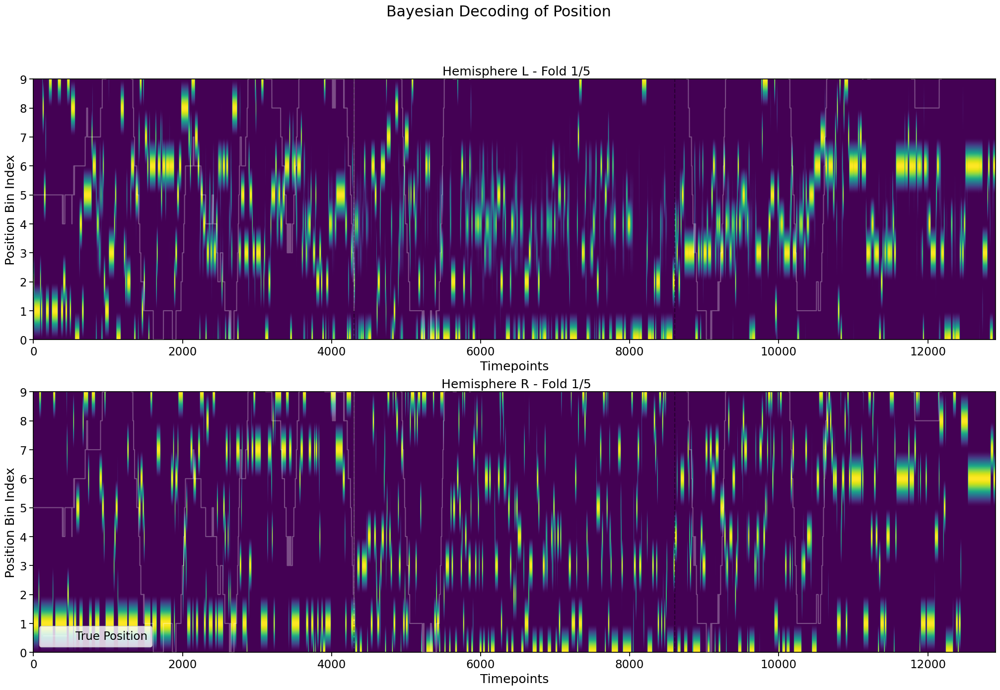

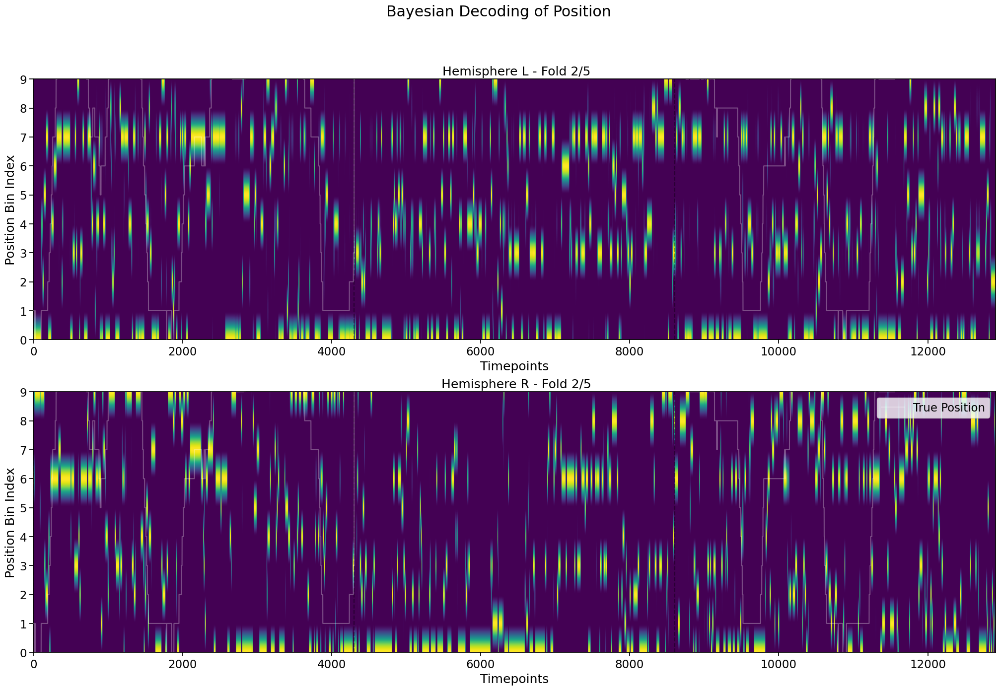

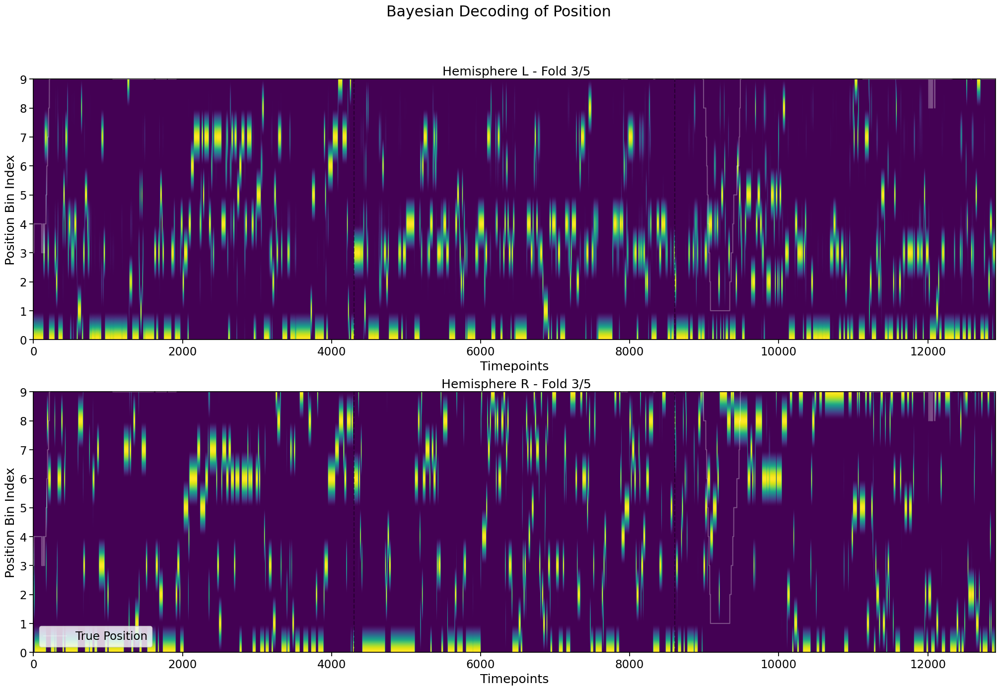

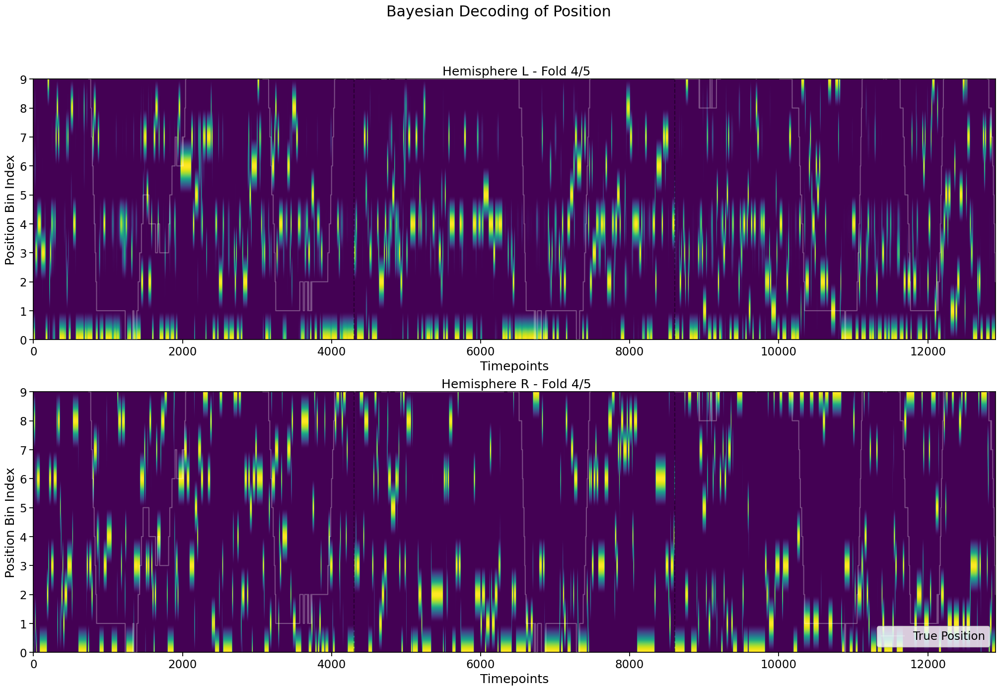

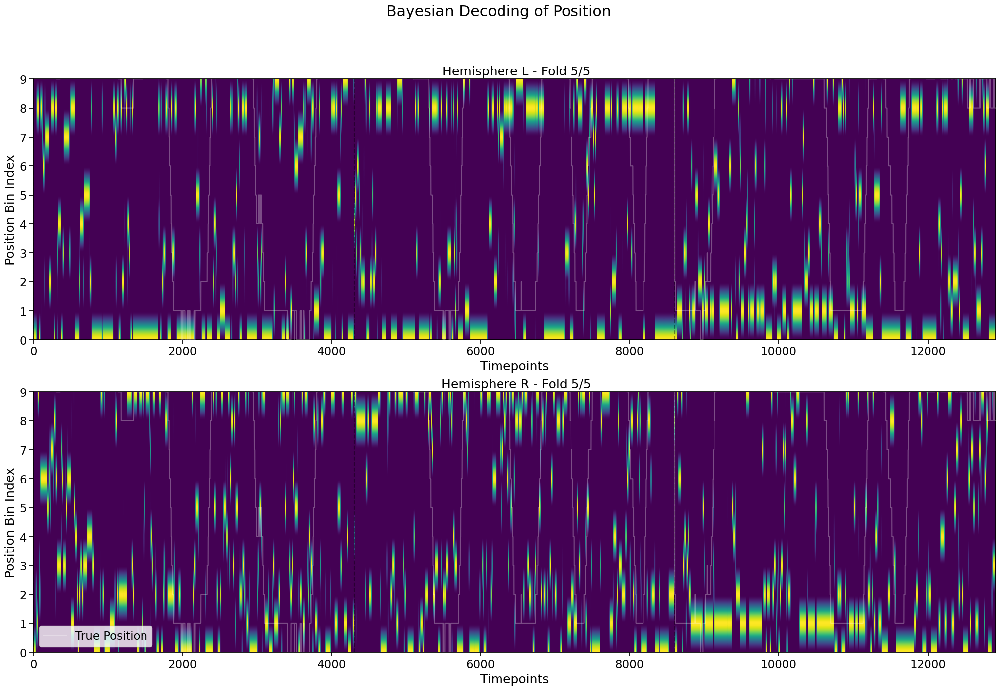

In [51]:
# running the decoder
dataset_L = DecoderDataset(spike_rates_concat_L, pos_idx)
dataset_R = DecoderDataset(spike_rates_concat_R, pos_idx)
decoder = GaussianBayesDecoder(n_bins=n_spatial_bins, var_floor=1e-4, uniform_prior=True)


k_CV = 5
n_blocks = 3

# looping over the cross-validation folds
for k in range(k_CV):

    fix, axs = plt.subplots(2, 1, figsize=(25, 15))
    for dataset, hemi, i in zip([dataset_L, dataset_R], ['L', 'R'], [0,1]): # looping through hemispheres
        ax = axs[i]

        # split the dataset into training and testing sets
        (X_train, Y_train), (X_test, Y_test), train_switch_ind, test_switch_ind = dataset.split(k=k, k_CV=k_CV, n_blocks=n_blocks)

        # fit the decoder
        decoder.fit(X_train, Y_train)

        # predict on the test set
        log_probs_test = decoder.predict_log_probabilities(X_test)  # shape: (n_bins, n_timepoints)
        log_post = log_probs_test - logsumexp(log_probs_test, axis=0, keepdims=True)  # normalize to get log posterior
        to_plot = np.exp(log_post)  # shape: (n_bins, n_timepoints)
        Y_pred_test = decoder.predict(X_test)  # shape: (n_timepoints,)

        # plot the log_probs heatmap for the test set with the true positions overlaid
        n_timepoints = log_probs_test.shape[1]
        indicies = np.arange(n_timepoints)  # x-axis for plotting

   
        vmin = np.percentile(to_plot, 2.5)
        vmax = np.percentile(to_plot, 97.5)
        ax.imshow(to_plot, aspect='auto', origin='lower', cmap='viridis', vmin=vmin, vmax=vmax)
        for switch in test_switch_ind:
            ax.axvline(x=switch, color='k', linestyle='--', alpha=0.4)
        ax.plot(indicies, Y_test, color='w', alpha=0.3, label='True Position', zorder=5)
        ax.set_ylim(0, n_spatial_bins - 1)
        ax.set_xlabel('Timepoints')
        ax.set_ylabel('Position Bin Index')
        ax.set_title(' Hemisphere ' + hemi + f' - Fold {k+1}/{k_CV}')
    
    plt.suptitle('Bayesian Decoding of Position')
    plt.legend()
    plt.show()

## Training the decoder on the wake period and testing on durring sleep

In [111]:
# ---- Baysian decoding configuration ----
use_regions = ['Th', 'CA1', 'CA2', 'CA3', 'RSP', 'A1', 'V1']
use_unit_types = ['Pyramidal Cell', 'Narrow Interneuron', 'Wide Interneuron']
n_spatial_bins = 25
pos_min, pos_max = -0.36, 0.
speed_threshold = 0.05  # m/s

# compute the spatial bin edges
bin_edges = np.linspace(pos_min, pos_max, n_spatial_bins + 1)

# choose which position to use
pos_raw = z_positions  # original position samples aligned to `frames` (units: cm)
assert frames.shape[0] == pos_raw.shape[0]

# Creating interpolation function for position
pos_interp_func = interp1d(ttls, pos_raw, kind = 'linear', bounds_error=False, fill_value=np.nan)

# getting the spike rates for the selected regions
selected_spike_rates_wake = []
selected_spike_rates_sleep = []
for probe in PROBES:
    spike_rate_matrix, tb, units = spike_rate_matrices[probe]  # (n_units, n_timebins)

    pos = pos_interp_func(tb)
    pos_idx = np.digitize(pos, bin_edges, right=True)

    # filtering out timebins outside the TTL range
    wake_time = (tb >= np.min(ttls)) & (tb <= np.max(ttls))
    sleep_time = ~wake_time
    transition_point = np.searchsorted(tb, np.min(ttls))

    spike_rate_matrix_wake = spike_rate_matrix[:, wake_time]
    spike_rate_matrix_sleep = spike_rate_matrix[:, sleep_time]
    time_bins_wake = tb[wake_time]
    time_bins_sleep = tb[sleep_time]
    pos_idx = pos_idx[wake_time]

    speed = np.abs(np.gradient(pos[wake_time]) / np.gradient(tb[wake_time]))
    speed = gaussian_filter1d(speed, sigma=1)
    move = speed > speed_threshold
    spike_rate_matrix_wake = spike_rate_matrix_wake[:, move]
    time_bins_wake = time_bins_wake[move]
    pos_idx = pos_idx[move]
    speed = speed[move]


    ct_probe = np.asarray(cell_types[probe])                    # len == n_units
    rgn_arr = regions[probe]                                   # len == n_units

    # select units from the selected regions
    unit_sel = np.where(
        (np.isin(ct_probe, use_unit_types)) &
        (np.isin(rgn_arr, use_regions))
    )[0]
    if unit_sel.size == 0:
        continue

    selected_spike_rates_wake.append(spike_rate_matrix_wake[unit_sel, :])
    selected_spike_rates_sleep.append(spike_rate_matrix_sleep[unit_sel, :])

# concatenating the selected spike rates across probes
if (len(selected_spike_rates_wake) == 0 or len(selected_spike_rates_sleep) == 0):
    raise RuntimeError("No units found for the chosen regions after filtering.")
spike_rates_wake = np.vstack(selected_spike_rates_wake)  # shape: (n_units_selected, n_timebins)
spike_rates_sleep = np.vstack(selected_spike_rates_sleep)  # shape: (n_units_selected, n_timebins)




In [112]:
decoder = GaussianBayesDecoder(n_bins=n_spatial_bins, var_floor=1e-4, uniform_prior=True)

# split the dataset into training and testing sets
X_train = spike_rates_wake
Y_train = pos_idx
X_test = spike_rates_sleep
Y_test = np.zeros(X_test.shape[1], dtype=int)  # dummy, as we don't have true positions during sleep

print(f"Training set: X_train={X_train.shape}, Y_train={Y_train.shape}")
print(f"Testing set: X_test={X_test.shape}, Y_test={Y_test.shape}")

# fit the decoder
decoder.fit(X_train, Y_train)

# predict on the test set
log_probs_test = decoder.predict_log_probabilities(X_test)  # shape: (n_bins, n_timepoints)
log_post = log_probs_test - logsumexp(log_probs_test, axis=0, keepdims=True)  # normalize to get log posterior
to_plot = np.exp(log_post).astype(np.float32)  # shape: (n_bins, n_timepoints)
Y_pred_test = decoder.predict(X_test)  # shape: (n_timepoints,)



Training set: X_train=(522, 28954), Y_train=(28954,)
Testing set: X_test=(522, 225878), Y_test=(225878,)


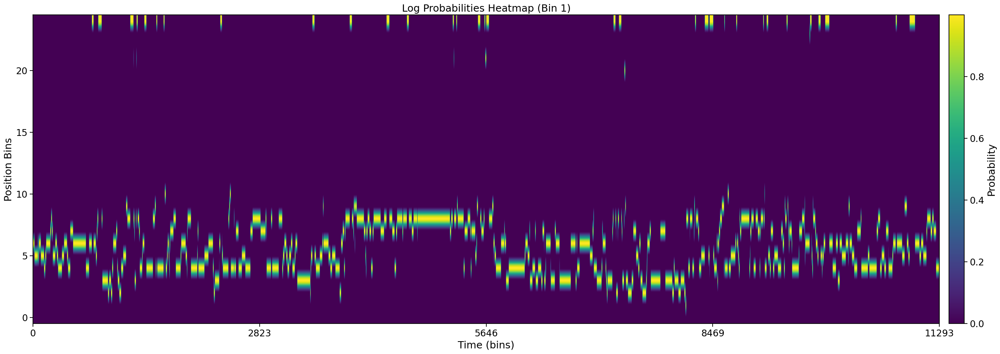

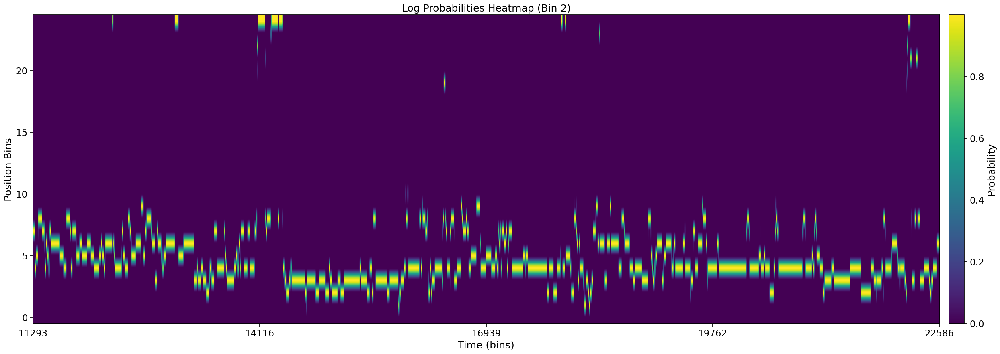

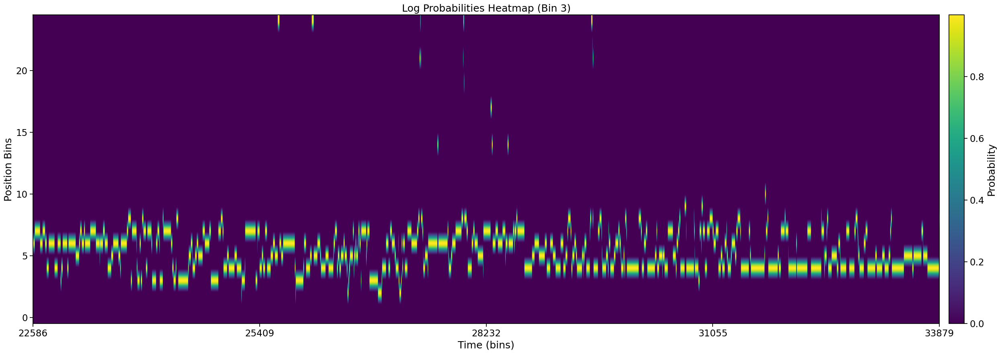

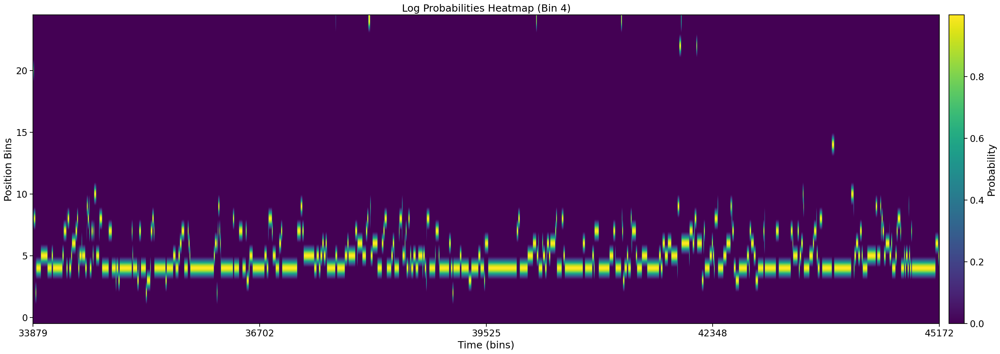

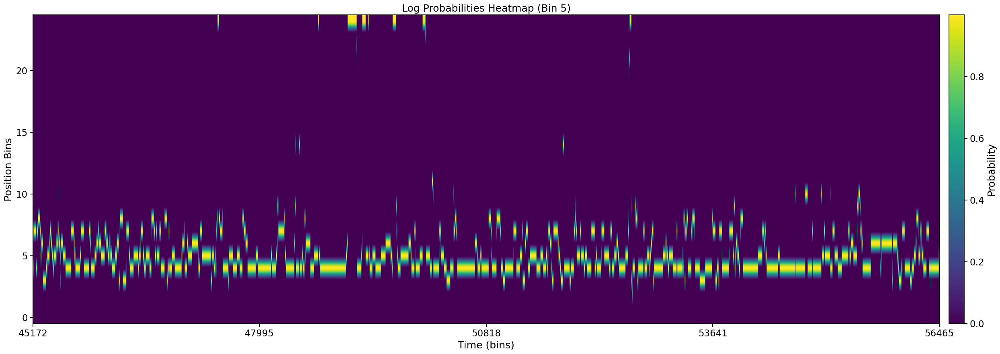

...

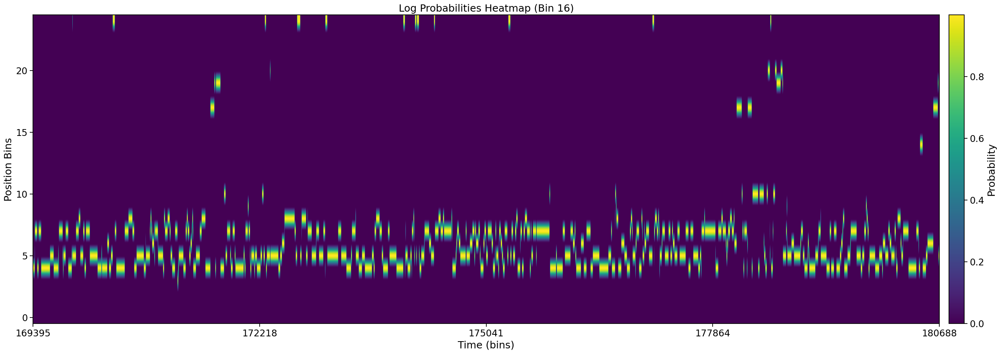

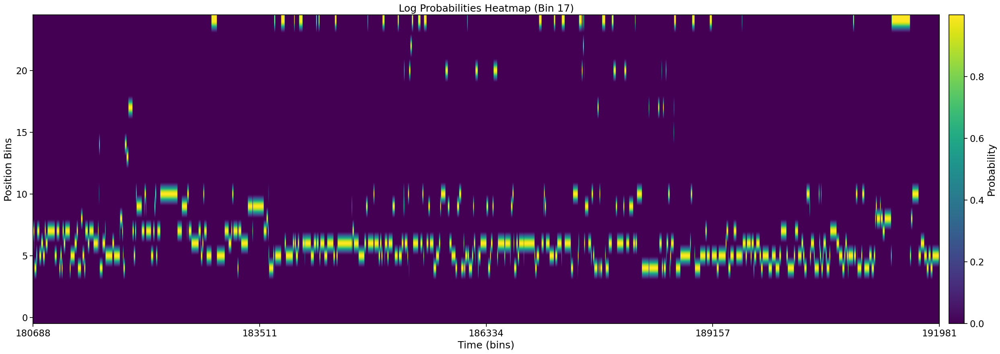

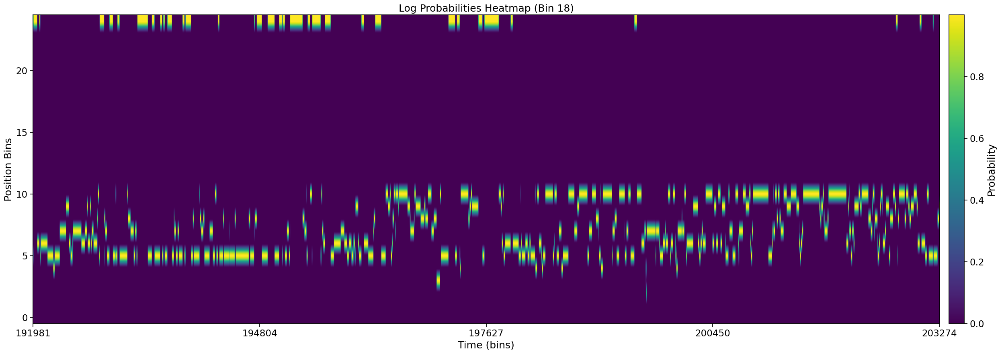

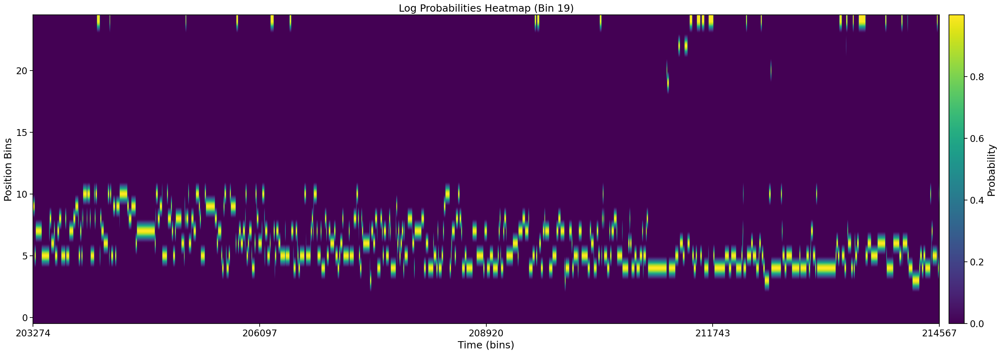

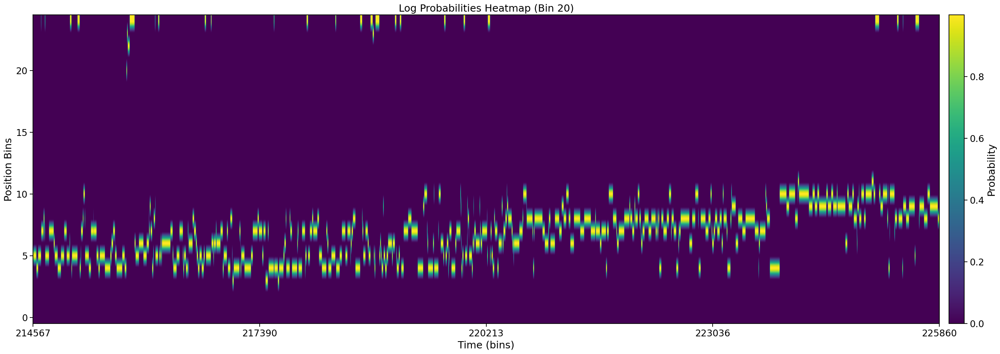

In [114]:
plot_bins = 20
bin_width = log_probs_test.shape[1] // plot_bins


#loop thorugh plot bins plotting each segment separately
for b in range(plot_bins):
    start = b * bin_width
    end = (b + 1) * bin_width
    plt.figure(figsize=(30,10))
    plt.imshow(to_plot[:, start:end], aspect='auto', origin='lower', cmap='viridis', vmin=vmin, vmax=vmax)
    plt.xticks(ticks=np.linspace(0, bin_width, 5), labels=np.linspace(start, end, 5, dtype=int))
    plt.title(f'Log Probabilities Heatmap (Bin {b+1})')
    plt.xlabel('Time (bins)')
    plt.ylabel('Position Bins')
    plt.colorbar(label='Probability', fraction=0.02, pad=0.01)
    plt.show()
